In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = [15, 10]


import sys
sys.path.append('../../')

In [2]:
from keras.preprocessing import image
import numpy as np
from sklearn.model_selection import train_test_split

from src.classifier import TLClassifier
from src.utilities import load_dataset_from_path, UIUC_EVENT_CLASS, CODALAB_GENDER_CLASS, CODALAB_SMILE_CLASS, KAGGLE_DOGCAT_CLASS
from src.plots import plot_confusion_matrix

Using TensorFlow backend.


# Kaggle Dog vs Cat

In [3]:
vgg16_model = TLClassifier('vgg16', 2, 'kaggle_dog_cat/224_224/model/vgg16/checkpoint/improved-016-0.99.hdf5')
inception_model = TLClassifier('inceptionv3',2, 'kaggle_dog_cat/224_224/model/inceptionv3/checkpoint/improved-015-0.99.hdf5')
resnet50_model = TLClassifier('resnet50',2, 'kaggle_dog_cat/224_224/model/resnet50/checkpoint/improved-010-0.99.hdf5')

Instructions for updating:
keep_dims is deprecated, use keepdims instead


../../src/utilities.py:325: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("se...)`
  output=top_model(base_model.output))


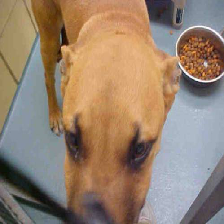

In [4]:
# Example image
kaggle_1_path = '../data/kaggle_dog_cat/dog.9934.jpg'
kaggle_1_img = image.load_img(kaggle_1_path, target_size=(224, 224))
kaggle_1 = image.img_to_array(kaggle_1_img)
kaggle_1 = np.expand_dims(kaggle_1, axis=0)
kaggle_1_img

In [5]:
from sklearn.metrics.classification import accuracy_score, confusion_matrix

print(vgg16_model.predict(kaggle_1))
print(inception_model.predict(kaggle_1))
print(resnet50_model.predict(kaggle_1))

[[ 0.  1.]]
[[  4.01807111e-27   1.00000000e+00]]
[[  1.21734999e-07   9.99999881e-01]]


## Predicting with 3 models

In [6]:
data_path = 'kaggle_dog_cat/224_224/training_data.npz'
label_path = 'kaggle_dog_cat/224_224/training_label.npz'
training_data = load_dataset_from_path(data_path)
training_label = load_dataset_from_path(label_path)
train_data, val_data, train_label, val_label = train_test_split(training_data, training_label, random_state=42, stratify=training_label)
metrics = [accuracy_score, confusion_matrix]

vgg16_preds = vgg16_model.predict(val_data)
vgg16_y = np.argmax(vgg16_preds, axis=1)
vgg16_scores = vgg16_model.evaluate_metrics(vgg16_y, val_label, metrics)

inception_preds = inception_model.predict(val_data)
inception_y = np.argmax(inception_preds, axis=1)
inception_scores = inception_model.evaluate_metrics(inception_y, val_label, metrics)

resnet50_preds = resnet50_model.predict(val_data)
resnet50_y = np.argmax(resnet50_preds, axis=1)
resnet50_scores = resnet50_model.evaluate_metrics(resnet50_y, val_label, metrics)

In [7]:
vgg16_scores,inception_scores,resnet50_scores

([0.98160000000000003, array([[3090,   35],
         [  80, 3045]])], [0.99695999999999996, array([[3112,   13],
         [   6, 3119]])], [0.98512, array([[3103,   22],
         [  71, 3054]])])

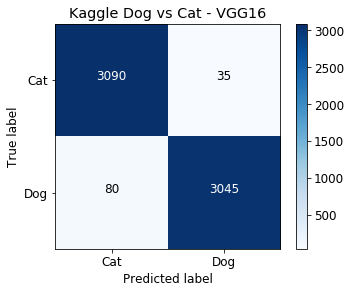

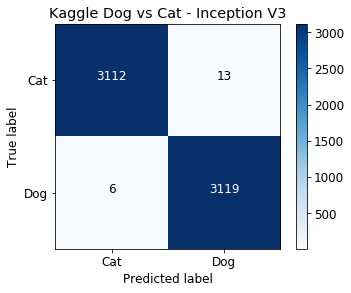

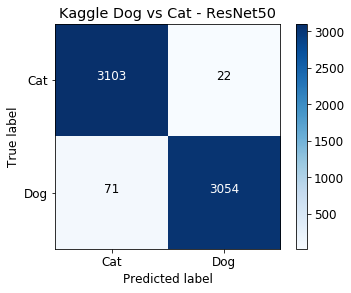

In [8]:
%matplotlib inline
plt.rcParams["figure.figsize"] = [5, 4]
plt.rcParams['font.size'] = 12
plot_confusion_matrix(plt, vgg16_scores[1], KAGGLE_DOGCAT_CLASS.values(), title='Kaggle Dog vs Cat - VGG16')
plot_confusion_matrix(plt, inception_scores[1], KAGGLE_DOGCAT_CLASS.values(), title='Kaggle Dog vs Cat - Inception V3')
plot_confusion_matrix(plt, resnet50_scores[1], KAGGLE_DOGCAT_CLASS.values(), title='Kaggle Dog vs Cat - ResNet50')

## Misclassified but has high confidence

In [9]:
from PIL import ImageFont
from PIL import ImageDraw

font = ImageFont.truetype("/usr/share/fonts/truetype/ubuntu-font-family/Ubuntu-B.ttf",17)

def wrong_class_high_probs(arc_y, arc_preds, val_label, n=10):
    # Get all the wrong classified images
    wrong_idx = np.where(arc_y != val_label)
    # Get the max probabilities (the max output of the 3 output neurons) of these wrong classified images
    wrong_idx_max_probs = np.max(arc_preds[wrong_idx], axis=1)
    # Sort based on those probabilities
    wrong_idx_probs_sorted = np.argsort(wrong_idx_max_probs)[::-1][:n]
    # Get the actual index of the images on wrong_idx
    sorted_wrong_idx = wrong_idx[0][wrong_idx_probs_sorted]
    return (sorted_wrong_idx, val_label[sorted_wrong_idx], arc_preds[sorted_wrong_idx], wrong_idx_max_probs[wrong_idx_probs_sorted.tolist()])

def draw_stats(img_array, true_label, pred_label, pred_prob):
    im = image.array_to_img(img_array)
    draw = ImageDraw.Draw(im)
    draw.text((0, 0),'True: %s \nPred: %s \nProb: %s' % (KAGGLE_DOGCAT_CLASS[int(true_label)], KAGGLE_DOGCAT_CLASS[pred_label], pred_prob),(0,255,0),font=font)
    draw = ImageDraw.Draw(im)
    return im

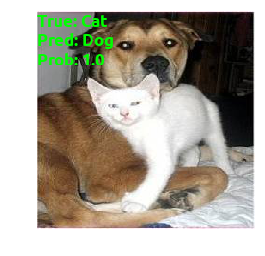

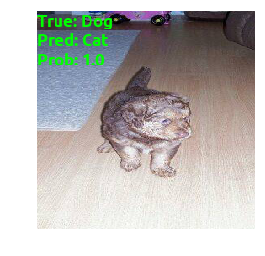

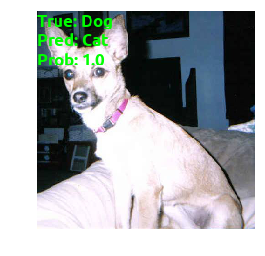

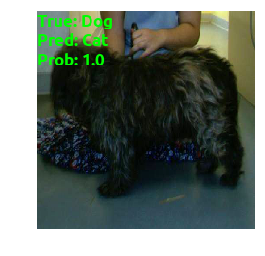

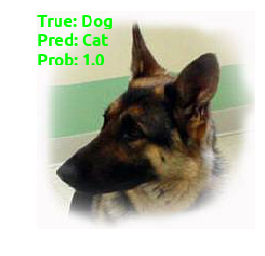

...

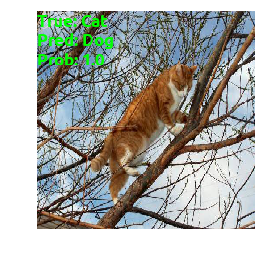

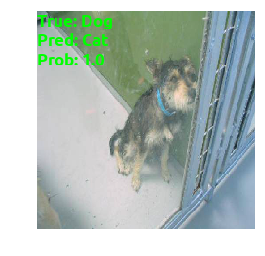

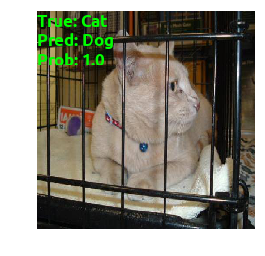

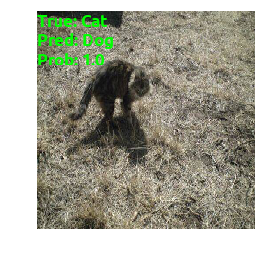

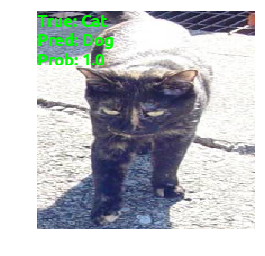

In [10]:
# Get all 10 images from VGG16
vgg16_sorted_wrong_idx, vgg16_true_labels, vgg16_pred_labels, vgg16_pred_probs = wrong_class_high_probs(vgg16_y, vgg16_preds, val_label, n=20) 
# Draw the images
for idx, wrong_idx in enumerate(vgg16_sorted_wrong_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[wrong_idx], val_label[wrong_idx], vgg16_y[wrong_idx], vgg16_pred_probs[idx]))

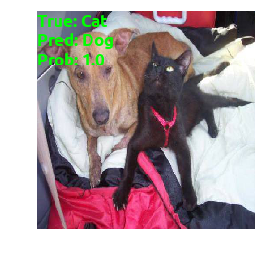

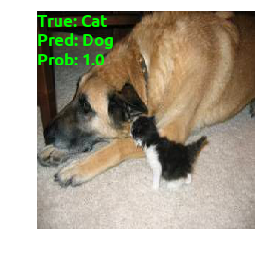

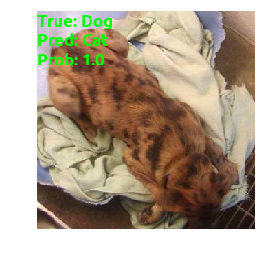

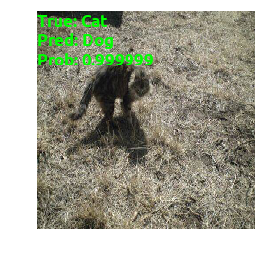

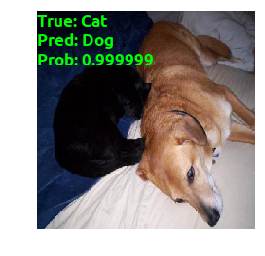

...

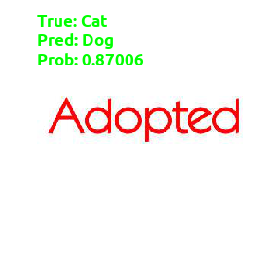

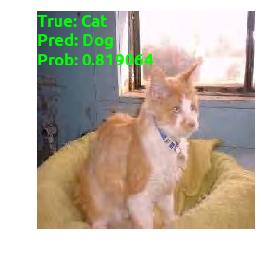

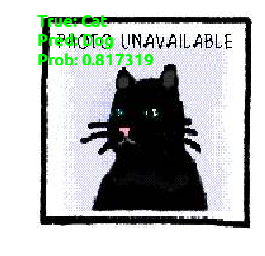

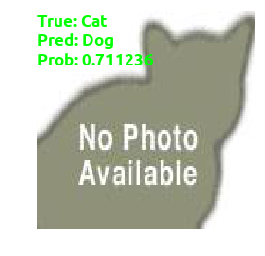

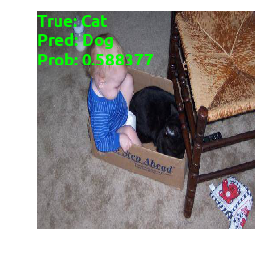

In [11]:
# Inceptionv3
inception_sorted_wrong_idx, inception_true_labels, inception_pred_labels, inception_pred_probs = wrong_class_high_probs(inception_y, inception_preds, val_label, n=20) 
# Draw the images
for idx, wrong_idx in enumerate(inception_sorted_wrong_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[wrong_idx], val_label[wrong_idx], inception_y[wrong_idx], inception_pred_probs[idx]))


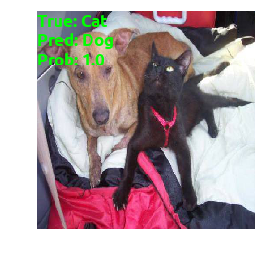

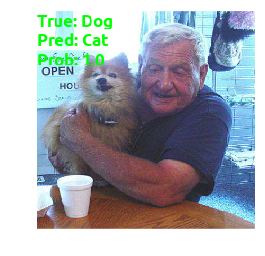

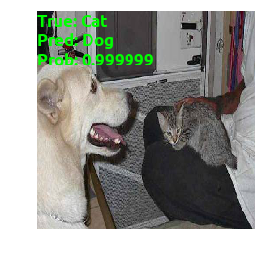

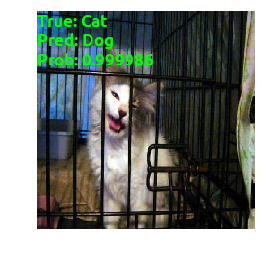

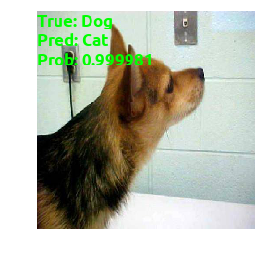

...

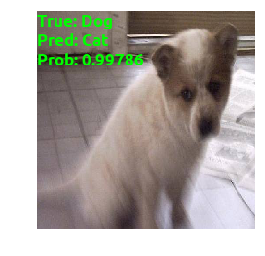

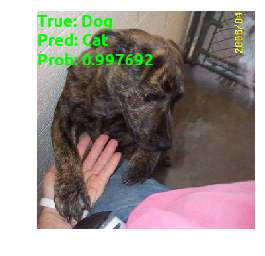

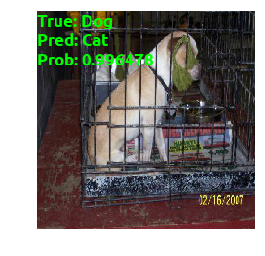

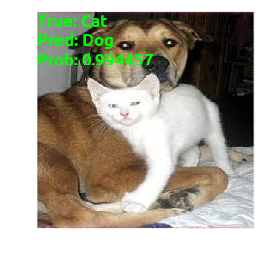

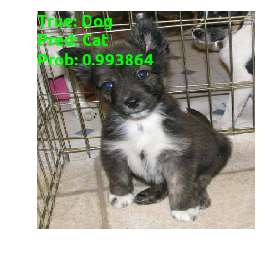

In [12]:
# resnet50
resnet50_sorted_wrong_idx, resnet50_true_labels, resnet50_pred_labels, resnet50_pred_probs = wrong_class_high_probs(resnet50_y, resnet50_preds, val_label, n=20) 
# Draw the images
for idx, wrong_idx in enumerate(resnet50_sorted_wrong_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[wrong_idx], val_label[wrong_idx], resnet50_y[wrong_idx], resnet50_pred_probs[idx]))


## Classified true but has low confidence

In [13]:
def right_class_low_probs(arc_y, arc_preds, val_label, n=10):
    # Get all the right classified images
    right_idx = np.where(arc_y == val_label)
    # Get the max probabilities (the max output of the 3 output neurons) of these right classified images
    right_idx_max_probs = np.max(arc_preds[right_idx], axis=1)
    # Sort based on those probabilities - ascending, get the first n
    right_idx_probs_sorted = np.argsort(right_idx_max_probs)[:n]
    # Get the actual index of the images on right_idx
    sorted_right_idx = right_idx[0][right_idx_probs_sorted]
    return (sorted_right_idx, val_label[sorted_right_idx], arc_preds[sorted_right_idx], right_idx_max_probs[right_idx_probs_sorted.tolist()])


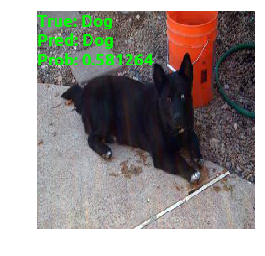

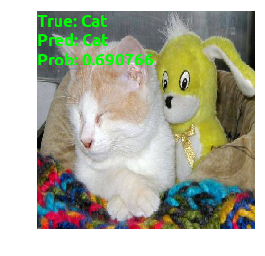

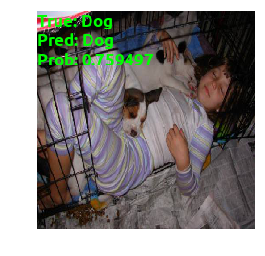

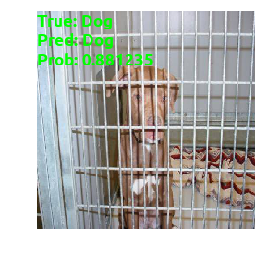

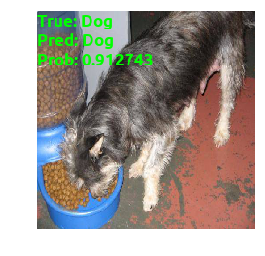

...

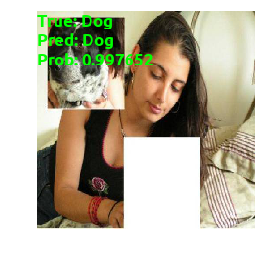

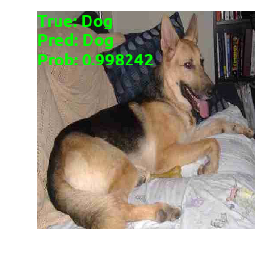

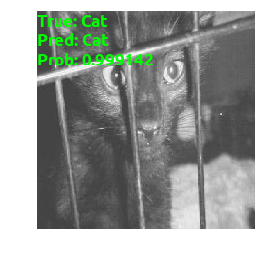

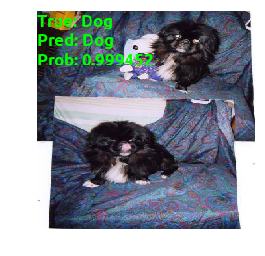

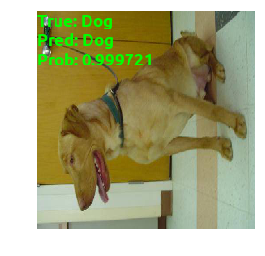

In [14]:
# Get all 10 images from VGG16
vgg16_right_sorted_idx, vgg16_right_true_labels, vgg16_right_pred_labels, vgg16_right_pred_probs = right_class_low_probs(vgg16_y, vgg16_preds, val_label, n=20) 
# Draw the images
for idx, right_idx in enumerate(vgg16_right_sorted_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[right_idx], val_label[right_idx], vgg16_y[right_idx], vgg16_right_pred_probs[idx]))

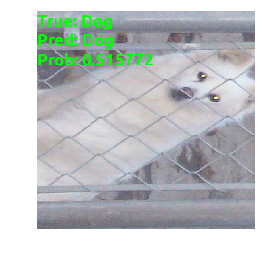

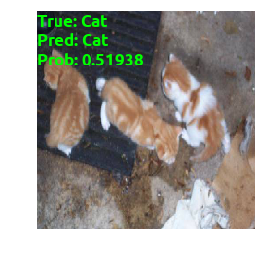

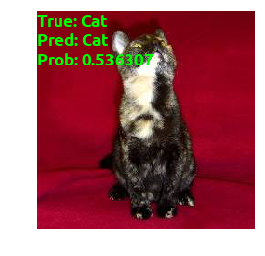

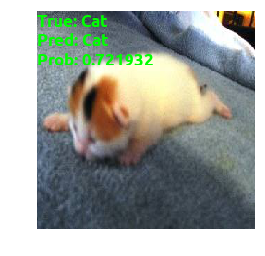

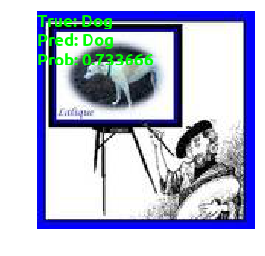

...

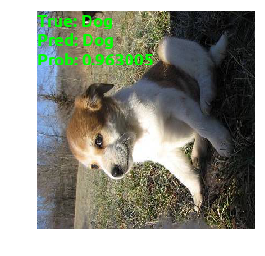

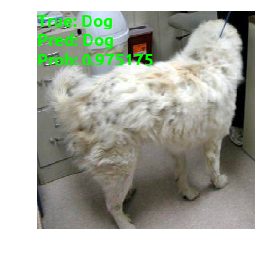

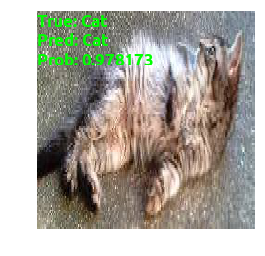

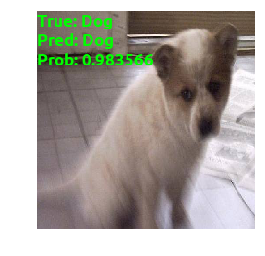

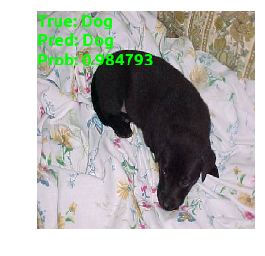

In [15]:
# Inception
inception_right_sorted_idx, inception_right_true_labels, inception_right_pred_labels, inception_right_pred_probs = right_class_low_probs(inception_y, inception_preds, val_label, n=20) 
# Draw the images
for idx, right_idx in enumerate(inception_right_sorted_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[right_idx], val_label[right_idx], inception_y[right_idx], inception_right_pred_probs[idx]))

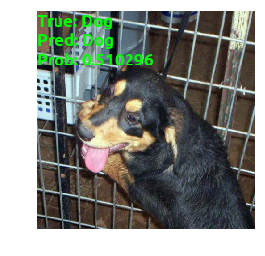

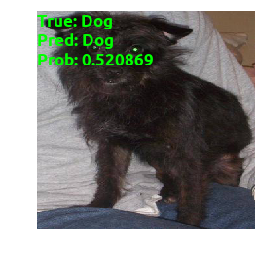

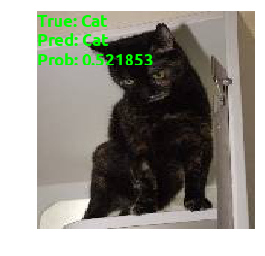

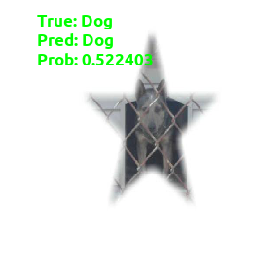

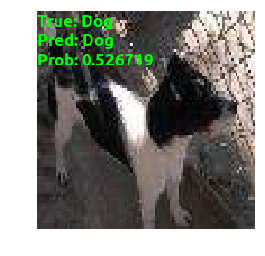

...

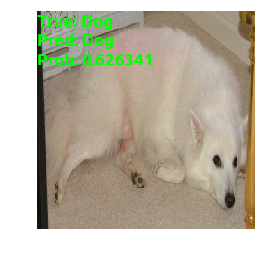

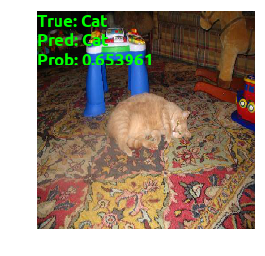

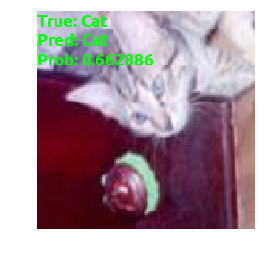

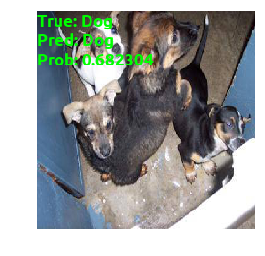

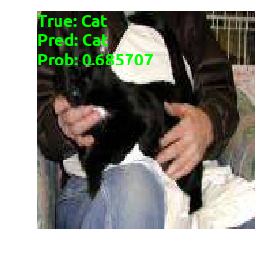

In [16]:
# Resnet50
resnet50_right_sorted_idx, resnet50_right_true_labels, resnet50_right_pred_labels, resnet50_right_pred_probs = right_class_low_probs(resnet50_y, resnet50_preds, val_label, n=20) 
# Draw the images
for idx, right_idx in enumerate(resnet50_right_sorted_idx.tolist()):
    plt.figure()
    plt.axis('off')
    plt.imshow(draw_stats(val_data[right_idx], val_label[right_idx], resnet50_y[right_idx], resnet50_right_pred_probs[idx]))